## House Sales in King County - LIME explanations

### Author: Piotr Grabysz
### Date: 26.03.2021

The goal of this notebook is to learn LIME (**L**ocal **I**nterpretable **M**odel-agnostic **E**xplanations) techniques.

I use House Sales in King County dateset and try to predict house's price based upon following features

- bedrooms - Number of bedrooms
- bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
- sqft_living - Square footage of the apartments interior living space
- sqft_lot - Square footage of the land space
- floors - Number of floors
- waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
- view - An index from 0 to 4 of how good the view of the property was
- condition - An index from 1 to 5 on the condition of the apartment,
- grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
- sqft_above - The square footage of the interior housing space that is above ground level
- sqft_basement - The square footage of the interior housing space that is below ground level
- yr_built - The year the house was initially built
- yr_renovated - The year of the house’s last renovation
- zipcode - What zipcode area the house is in
- lat - Lattitude
- long - Longitude
- sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
- sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

### Data loading and preparation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

%matplotlib inline

In [2]:
house_data = pd.read_csv("kc_house_data.csv")
house_data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
X = house_data.drop(["id", "price", "date", "zipcode"], axis = 1).to_numpy()
y = house_data["price"]

I make train test split. Becuase the range of prices is very big I do stratified split to ensure that in both datasets the ratio of cheap and expensive samples is similar.

In [4]:
y_binned = y.apply(lambda x: round(x/1e+5) if x<2e+6 else 21)
bins = y_binned.unique().tolist()
bins.sort()

X_train, X_test, y_train, y_test = train_test_split(X, y_binned, test_size = 0.3, stratify = y_binned, random_state = 1)

# now y_train is splitted y_binned. I want y, but with indexes from splitted y_binned
y_train = y.iloc[y_train.index]
y_test = y.iloc[y_test.index]

### Training the model - XGBoost

I train XGBoost model with parameters I found performing well in the previous homework

In [5]:
import xgboost

xgb_model = xgboost.XGBRegressor(colsample_bytree=0.6, eta=0.15, max_depth=5, gamma=0,
                                 objective="reg:squarederror", random_state=1)

xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.6, eta=0.15, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.150000006, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=1,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [11]:
y_hat = xgb_model.predict(X_test)

# I rescale back the precises to the original values to make it possible to compare to xgboost
print(f"Mean absolute error on the test set: {abs(y_hat - y_test).mean():,.0f}$")

Mean absolute error on the test set: 68,818$


In the previoius notebook about SHAP I chose three different observations: one which price is *low*, one which price is around the *average* and one with very *high price*. I use the same observations in this notebook:

In [6]:
cheap_house_idx = 465
average_house_idx = 18838
expensive_house_idx = 9254
house_data.drop(["id", "date", "zipcode"], axis = 1).iloc[[cheap_house_idx, average_house_idx, expensive_house_idx]]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
465,80000.0,1,0.75,430,5050,1.0,0,0,2,4,430,0,1912,0,47.6499,-121.909,1200,7500
18838,540000.0,3,2.50,2400,5817,2.0,0,0,3,8,2400,0,1998,0,47.5371,-121.870,2420,5817
9254,6885000.0,6,7.75,9890,31374,2.0,0,4,3,13,8860,1030,2001,0,47.6305,-122.240,4540,42730


In [7]:
y_pred = xgb_model.predict(X[[cheap_house_idx, average_house_idx, expensive_house_idx],:])
y_real = y[[cheap_house_idx, average_house_idx, expensive_house_idx]]

preds = pd.DataFrame(data = {"Prediction" : y_pred, 
                             "The real price" : y_real,
                             "The difference" : abs(y_pred - y_real)
                            }
                    )

preds = preds.style.format("{:,.0f}")
preds

,Prediction,The real price,The difference
465,"150,118","80,000","70,118"
18838,"539,440","540,000",560
9254,"6,908,374","6,885,000","23,374"


For the first, cheap example, my prediction is very inaccurate. But it is decent for the remaining two exemplary observations.

### LIME

In [17]:
import lime
import lime.lime_tabular

LimeTabularExplainer needs providing names of all features and indices of categorical features.

In [19]:
feature_names = house_data.drop(["id", "price", "date", "zipcode"], axis = 1).columns

categorical_features = np.argwhere(np.array([len(set(X[:,x])) for x in range(X.shape[1])]) <= 13).flatten()

print(f'The categorical features are {house_data.drop(["id", "price", "date", "zipcode"], axis = 1).columns[categorical_features].to_list()}')

The categorical features are ['bedrooms', 'floors', 'waterfront', 'view', 'condition', 'grade']


In [20]:
explainer = lime.lime_tabular.LimeTabularExplainer(X, 
                                                   feature_names=feature_names, 
                                                   class_names=["price"], 
                                                   categorical_features=categorical_features,
                                                   discretize_continuous=True,
                                                   verbose=True, 
                                                   mode='regression')

#### 1) Low price example

In [154]:
exp = explainer.explain_instance(X[cheap_house_idx,:], xgb_model.predict, num_features = 10)

exp.show_in_notebook(show_table=True)

Intercept 836678.606150025
Prediction_local [379818.20508214]
Right: 150117.92


One should be careful when analyzing explanation for this particular model, because my xgboost heavily overestimates the price (from 80,000\\$	to 150,118\\$), and the local linear model overestimates it even further: to 379,818\\$! This might be because there is a little data with prices that low. And of a lot of data have prices 10 or even 100 times greater (so it *might* be a better idea to train the model on logarithm of house prices).

While keeping this in mind, we see that the factor which has great positive impact on the price is **latitude**. As I showed in the previous notebook more expensive houses are located in the center area, along the river:

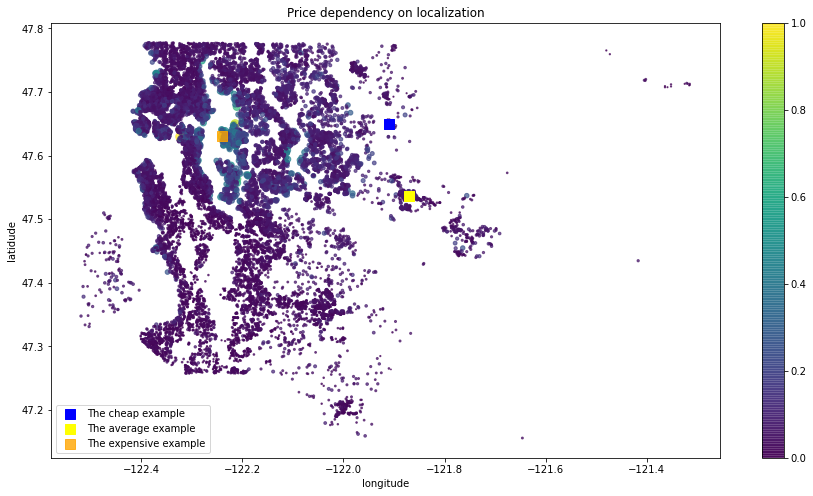

<Figure size 1440x720 with 0 Axes>

In [63]:
plt.figure(figsize=(15, 8))
plt.scatter(house_data["long"], house_data["lat"], 
            c = house_data["price"], cmap = "viridis", alpha = 0.7,
            s = house_data["price"]/100000)
plt.scatter(house_data["long"].iloc[cheap_house_idx], house_data["lat"].iloc[cheap_house_idx],
           s = 100, marker = "s", c="blue", label="The cheap example")

plt.scatter(house_data["long"].iloc[average_house_idx], house_data["lat"].iloc[average_house_idx],
           s = 100, marker = "s", c="yellow", label="The average example")

plt.scatter(house_data["long"].iloc[expensive_house_idx], house_data["lat"].iloc[expensive_house_idx],
           s = 100, marker = "s", c="orange", label="The expensive example", alpha = 0.8)


plt.xlabel("longitude")
plt.ylabel("latidude")
plt.title("Price dependency on localization")
plt.colorbar()
plt.legend()
plt.figure(figsize=(20, 10))
plt.show()

As can be seen, this house lies at latitude similar to expensive houses, however it is located in a completely different area.

The lack of view of **waterfront** lowers the price significantly. It sounds understandable, but I am surprised that this plays the biggest role, much bigger for example than small square footage. Personally, I would put more weight on square footage and grade than on acces to waterfront view.

**grade**, **sqft_living** (square footage of the living space) and **view** contributes negatively in the price. This is plausible, since they values are low in comparison to other houses.

**yr_built** < 1951 (the first quartile) has small positive contribution. It is hard for me to say why without knowing Seattle's history and architecture. I plotted price distribution conditioned on yr_built, but based upon it there is no evidence that having yr_built < 1951 supports bigger prices.

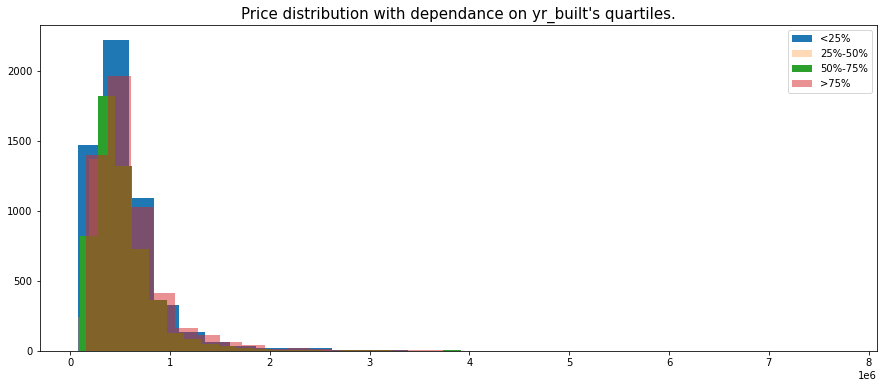

In [110]:
quantiles = [house_data["yr_built"].quantile(q=q) for q in [0.25, 0.5, 0.75]]

plt.figure(figsize=(15,6))
plt.hist(house_data[house_data["yr_built"] <= quantiles[0]]["price"], bins = 30, label = "<25%")
plt.hist(house_data[(house_data["yr_built"] > quantiles[0]) & (house_data["yr_built"] <= quantiles[1])]["price"], 
                    bins = 30, alpha=0.3, label="25%-50%")
plt.hist(house_data[(house_data["yr_built"] > quantiles[1]) & (house_data["yr_built"] <= quantiles[2])]["price"], 
                    bins = 30, label="50%-75%")
plt.hist(house_data[(house_data["yr_built"] > quantiles[2])]["price"], 
                    bins = 30, alpha=0.5, label=">75%")

plt.title("Price distribution with dependance on yr_built's quartiles.", fontsize = 15)
plt.legend()
plt.show()

#### 2) Average price example

In [155]:
exp = explainer.explain_instance(X[average_house_idx,:], xgb_model.predict, num_features = 10)

exp.show_in_notebook(show_table=True)

Intercept 984840.0305899174
Prediction_local [511320.00406766]
Right: 539439.8


For the average price example, the prediction of my model is pretty accurate (real: 540,000\\$, predicted: 539,440\\$) and the local model's prediction is also not so far away from the truth: 511,320\\$

The biggest, negative impact is made by **waterfront**=0. As I mentioned in the previous example, it is clear that not having the waterfront view is worser than having it, but it is quite concerning that this is the most important factor.

The features having positive contribution in the price are **square footage of 15** nearest neighbors, **square footage above** the ground level and **year of built**.

#### It is surprising to me that square footage of the actual living space of the house has much lower impact on the prediction than square footage of neighbors. Maybe one of this two variables is somehow redundant?

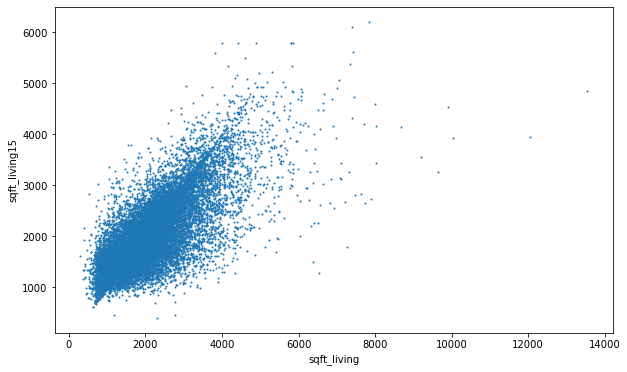

In [158]:
plt.figure(figsize=(10,6))
plt.scatter(house_data["sqft_living"], house_data["sqft_living15"], s=1)
plt.xlabel("sqft_living")
plt.ylabel("sqft_living15")
plt.show()

We can see on the plot above that these variables are correlated, but there is a lot variance as well, so I would't call them redundant.

#### The high price example

In [159]:
exp = explainer.explain_instance(X[expensive_house_idx,:], xgb_model.predict, num_features = 10)

exp.show_in_notebook(show_table=True)

Intercept 728549.6432037362
Prediction_local [2827748.74171172]
Right: 6908374.5


For this example my model is very accurate: it predicted 6,908,374\\$ while the real price is 6,885,000\\$. The local model predicted terribly bad, predicting 2,827,749\\$ so less than a half of the price. It might becuase this expensive example is an outlier:

In [141]:
(house_data["price"] >= 6885000).sum()

3

This house is the third most expensive house. So maybe there wasn't much data supporting such high prices and the local model couldn't learn them.

Anyway, predicted 2,827,748\\$ is still a lot and almost all the features contributes positevely in reaching such price. The most important one is **the highest possible grade and view**, as well as big **living space** and exceptional **number of bedrooms**.

As for the two previous examples, the lack of **waterfront view** is lowering the price. Well, for the estate of this quality such a thing might be an issue.

### Training a second model - neural network

In [12]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaler_y = StandardScaler()
scaler_y.fit(y_train.to_frame())
y_train_scaled = scaler_y.transform(y_train.to_frame())
y_test_scaled = scaler_y.transform(y_test.to_frame())

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from keras.models import load_model

batchsize = 500
dropout_rate = 0.2
neural_net_model = Sequential([
    Dense(256, activation="relu"),
    Dropout(dropout_rate),
    Dense(256, activation="relu"),
    Dropout(dropout_rate),
    Dense(256, activation="relu"),
    Dropout(dropout_rate),
    Dense(1, activation=None),
])

neural_net_model.compile(
    loss="mean_squared_error",
    optimizer="adam"
)

neural_net_model.build(input_shape=(batchsize, X_train_scaled.shape[1]))
neural_net_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (500, 256)                4608      
_________________________________________________________________
dropout_3 (Dropout)          (500, 256)                0         
_________________________________________________________________
dense_5 (Dense)              (500, 256)                65792     
_________________________________________________________________
dropout_4 (Dropout)          (500, 256)                0         
_________________________________________________________________
dense_6 (Dense)              (500, 256)                65792     
_________________________________________________________________
dropout_5 (Dropout)          (500, 256)                0         
_________________________________________________________________
dense_7 (Dense)              (500, 1)                 

In [164]:
history = neural_net_model.fit(X_train_scaled, y_train_scaled, validation_data=(X_test_scaled, y_test_scaled),
                               batch_size=batchsize, epochs=300, verbose=0)

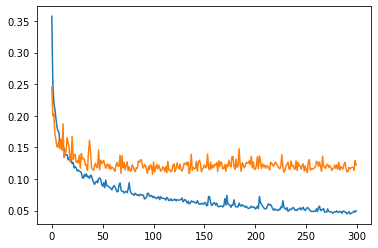

In [165]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])

In [166]:
y_hat = neural_net_model.predict(X_test_scaled)

# I rescale back the precises to the original values to make it possible to compare to xgboost
y_hat = scaler_y.inverse_transform(y_hat)
print(f"Mean absolute error on the test set: {abs(y_hat - scaler_y.inverse_transform(y_test_scaled)).mean():.0f}$")

Mean absolute error on the test set: 73075$


In [15]:
# neural_net_model.save("neural_net_model.h5")
neural_net_model = load_model("neural_net_model.h5")

In [22]:
explainer_nn = lime.lime_tabular.LimeTabularExplainer(scaler.transform(X), 
                                                   feature_names=feature_names, 
                                                   class_names=["price"], 
                                                   categorical_features=categorical_features,
                                                   discretize_continuous=True,
                                                   verbose=True, 
                                                   mode='regression')

#### Low price example

Neural network explanation (one should be aware that all the printed values are different than those in the dataset, because they were scaled before training the network):

In [24]:
exp_nn = explainer_nn.explain_instance(scaler.transform(X)[cheap_house_idx,:], neural_net_model.predict, num_features = 10)
exp_nn.show_in_notebook(show_table=True)

Intercept 1.1748008147860012
Prediction_local [-0.67143288]
Right: -0.9311144


Lets recall the explanation of the XGBoost model:

In [26]:
exp = explainer.explain_instance(X[cheap_house_idx,:], xgb_model.predict, num_features = 10)
exp.show_in_notebook(show_table=True)

Intercept 928096.650275759
Prediction_local [450928.20990313]
Right: 150117.92


We can see that the explanations are similar, with waterfront and lat being the most important

#### Average price example

Neural network explanation:

In [27]:
exp_nn = explainer_nn.explain_instance(scaler.transform(X)[average_house_idx,:], neural_net_model.predict, num_features = 10)
exp_nn.show_in_notebook(show_table=True)

Intercept 1.19507116129086
Prediction_local [-0.01340696]
Right: -0.11345779


XGBoost explanation:

In [29]:
exp = explainer.explain_instance(X[average_house_idx,:], xgb_model.predict, num_features = 10)
exp.show_in_notebook(show_table=True)

Intercept 1033640.554879695
Prediction_local [474906.05710073]
Right: 539439.8


These explanations look similar. No **waterfront** is the most important factor. **Longidute**, **view**, **condition** **sqft_15** are important for both models. The only major difference is that **sqft_above** is second most important feature for the neural network, whereas it has almost no importance for xgb.

#### High price example

Neural network explanation:

In [32]:
exp_nn = explainer_nn.explain_instance(scaler.transform(X)[expensive_house_idx,:], neural_net_model.predict, num_features = 10)
exp_nn.show_in_notebook(show_table=True)

Intercept 0.5898269852928729
Prediction_local [5.19754778]
Right: 14.798822


XGBoost explanation:

In [33]:
exp = explainer.explain_instance(X[expensive_house_idx,:], xgb_model.predict, num_features = 10)
exp.show_in_notebook(show_table=True)

Intercept 675971.6013223047
Prediction_local [3193172.62645307]
Right: 6908374.5


The above explanations are very similar.

### Some final thoughts

One interesting thing I've noticed is persistently important role of **waterfront**. The lack of waterfront view is the most important factor in 4 out of 6 cases. And in all of them it is one of the most important factors lowering the price.

I have two questions:

#### 1) Is waterfront variable so important when waterfront==1?

Lets choose some houses with waterfront

In [38]:
house_data[house_data["waterfront"]==1].head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
49,822039084,20150311T000000,1350000.0,3,2.50,2753,65005,1.0,1,2,...,9,2165,588,1953,0,98070,47.4041,-122.451,2680,72513
230,8096000060,20150413T000000,655000.0,2,1.75,1450,15798,2.0,1,4,...,7,1230,220,1915,1978,98166,47.4497,-122.375,2030,13193
246,2025069065,20140929T000000,2400000.0,4,2.50,3650,8354,1.0,1,4,...,9,1830,1820,2000,0,98074,47.6338,-122.072,3120,18841
264,2123039032,20141027T000000,369900.0,1,0.75,760,10079,1.0,1,4,...,5,760,0,1936,0,98070,47.4683,-122.438,1230,14267
300,3225069065,20140624T000000,3075000.0,4,5.00,4550,18641,1.0,1,4,...,10,2600,1950,2002,0,98074,47.6053,-122.077,4550,19508


In [41]:
waterfront_idx1 = 230
waterfront_idx2 = 246

exp = explainer.explain_instance(X[waterfront_idx1,:], xgb_model.predict, num_features = 10)
exp.show_in_notebook(show_table=True)

Intercept 636234.0330579195
Prediction_local [768411.3481272]
Right: 648339.25


In [42]:
exp = explainer.explain_instance(X[waterfront_idx2,:], xgb_model.predict, num_features = 10)
exp.show_in_notebook(show_table=True)

Intercept 459744.7363705437
Prediction_local [1422194.88969295]
Right: 2339385.5


For both chosen examples waterfront is the most important feature again.

#### 2) Is this role of waterfront visible in prices distribution?

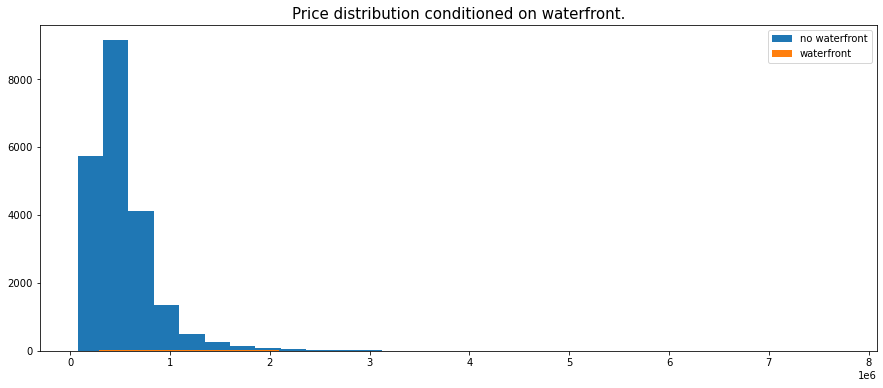

In [31]:
plt.figure(figsize=(15,6))
plt.hist(house_data[house_data["waterfront"]==0]["price"], bins=30, label="no waterfront")
plt.hist(house_data[house_data["waterfront"]==1]["price"], bins=30, label="waterfront")
plt.title("Price distribution conditioned on waterfront.", fontsize = 15)
plt.legend()
plt.show()

There are almost no samples in the dataset with waterfront==1. I can't understand why my models give this feature such a big role.

My last comment is about **plausibility of the explanations**. For the selected samples, explanations for the XGBoost and neural network were similar. I believe that this might be an evidence that this models are stable. But if their explanations differ, I cannot decide which explanation is more plausible without having any extra expert knowledge.